# Main Competitors of Banh Mi Boys in Toronto

In [1]:
import pandas as pd
import folium
from folium import plugins
from folium.plugins import HeatMap
import numpy as np
import matplotlib.pyplot as plt

We will use this csv file with all reviews put in businesses that are located in TORONTO

In [2]:
business=pd.read_csv('reviews_rest_Toronto.csv')

In [3]:
business.head()

,Unnamed: 0,business_id,cool,date,funny,review_id,stars_x,text,useful,user_id,...,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars_y,state
0,0,qUWqjjjfpB2-4P3He5rsKw,0,2017-06-06 19:04:10,0,mM8i91yWP1QbImEvz5ds0w,4,"In the heart of Chinatown, I discovered it enr...",0,TZQSUDDcA4ek5gBd6BzcjA,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",1,43.655289,-79.399303,Levetto,M5T 2G5,145,4.0,ON
1,1,9Eghhu_LzEJgDKNgisf3rg,0,2016-08-25 16:25:12,0,nAm92_-WUQ084x9Uz9iFmA,3,Was super excited to bring my boyfriend to thi...,0,iFEM16O5BeKvf_AHs6NzUQ,...,Toronto,"{'Monday': '0:0-0:0', 'Tuesday': '11:30-0:0', ...",1,43.659095,-79.382915,Scaddabush Italian Kitchen & Bar,M5B 1S8,456,3.5,ON
2,2,9Eghhu_LzEJgDKNgisf3rg,2,2016-03-30 22:19:07,2,RaoWgOw66l7LCendPEDivg,4,My second visit here was much better because I...,2,zWWcik1fRPZviBCQLC26FQ,...,Toronto,"{'Monday': '0:0-0:0', 'Tuesday': '11:30-0:0', ...",1,43.659095,-79.382915,Scaddabush Italian Kitchen & Bar,M5B 1S8,456,3.5,ON
3,3,9Eghhu_LzEJgDKNgisf3rg,0,2017-11-06 20:26:32,0,O9bxSBKvB2MEbPNyW0f29g,5,I went here for my birthday. It was my first ...,0,leDvTjYAq4DmaxaOjq8Jbg,...,Toronto,"{'Monday': '0:0-0:0', 'Tuesday': '11:30-0:0', ...",1,43.659095,-79.382915,Scaddabush Italian Kitchen & Bar,M5B 1S8,456,3.5,ON
4,4,9Eghhu_LzEJgDKNgisf3rg,0,2015-04-15 06:16:15,0,DCTPTcmjVais_xZBWKrhqw,4,This was my third time visiting this restauran...,0,nmI6LoOi0zvHaH7rwISRCw,...,Toronto,"{'Monday': '0:0-0:0', 'Tuesday': '11:30-0:0', ...",1,43.659095,-79.382915,Scaddabush Italian Kitchen & Bar,M5B 1S8,456,3.5,ON


In [4]:
business.describe()

,Unnamed: 0,cool,funny,stars_x,useful,is_open,latitude,longitude,review_count,stars_y
count,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000
mean,353.651312,0.483473,0.339949,3.661709,1.064962,0.800216,43.673474,-79.390851,231.464355,3.657941
std,224.821244,1.907746,1.411494,1.268022,2.548339,0.399838,0.042379,0.045191,324.491679,0.541241
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,43.592327,-79.680563,3.000000,1.000000
25%,162.000000,0.000000,0.000000,3.000000,0.000000,1.000000,43.648923,-79.410376,59.000000,3.500000
50%,335.000000,0.000000,0.000000,4.000000,0.000000,1.000000,43.656586,-79.392677,133.000000,3.500000
75%,526.000000,0.000000,0.000000,5.000000,1.000000,1.000000,43.672624,-79.378927,275.000000,4.000000
max,1056.000000,164.000000,193.000000,5.000000,160.000000,1.000000,43.876501,-79.137540,2758.000000,5.000000


Let's only consider the restaurants

In [5]:
business=business[business['categories'].notnull()==True]
restaurants=business[business['categories'].str.contains('Restaurants')]

In [6]:
restaurants.describe()

,Unnamed: 0,cool,funny,stars_x,useful,is_open,latitude,longitude,review_count,stars_y
count,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000,399251.000000
mean,353.651312,0.483473,0.339949,3.661709,1.064962,0.800216,43.673474,-79.390851,231.464355,3.657941
std,224.821244,1.907746,1.411494,1.268022,2.548339,0.399838,0.042379,0.045191,324.491679,0.541241
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,43.592327,-79.680563,3.000000,1.000000
25%,162.000000,0.000000,0.000000,3.000000,0.000000,1.000000,43.648923,-79.410376,59.000000,3.500000
50%,335.000000,0.000000,0.000000,4.000000,0.000000,1.000000,43.656586,-79.392677,133.000000,3.500000
75%,526.000000,0.000000,0.000000,5.000000,1.000000,1.000000,43.672624,-79.378927,275.000000,4.000000
max,1056.000000,164.000000,193.000000,5.000000,160.000000,1.000000,43.876501,-79.137540,2758.000000,5.000000


In [7]:
BanhMiBoys=restaurants[restaurants['name']=='Banh Mi Boys']

In [8]:
BanhMiBoys.describe()

,Unnamed: 0,cool,funny,stars_x,useful,is_open,latitude,longitude,review_count,stars_y
count,1747.000000,1747.000000,1747.000000,1747.000000,1747.000000,1747.0,1747.000000,1747.000000,1747.000000,1747.000000
mean,185.116772,0.431597,0.316543,4.213509,0.694333,1.0,43.656537,-79.393692,852.204923,4.327132
std,153.997192,1.646367,1.513201,0.885599,2.016367,0.0,0.017905,0.011751,343.648735,0.237872
min,0.000000,0.000000,0.000000,1.000000,0.000000,1.0,43.648827,-79.500580,13.000000,4.000000
25%,56.000000,0.000000,0.000000,4.000000,0.000000,1.0,43.648827,-79.396970,483.000000,4.000000
50%,136.000000,0.000000,0.000000,4.000000,0.000000,1.0,43.648827,-79.396970,1097.000000,4.500000
75%,287.000000,0.000000,0.000000,5.000000,1.000000,1.0,43.659097,-79.382078,1097.000000,4.500000
max,969.000000,40.000000,47.000000,5.000000,47.000000,1.0,43.770245,-79.382078,1097.000000,4.500000


In [9]:
BanhMiBoys.head()

,Unnamed: 0,business_id,cool,date,funny,review_id,stars_x,text,useful,user_id,...,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars_y,state
73459,56,ttuEwktrkmh3TUlSFPZqAA,0,2014-02-24 00:24:33,0,axNbl3T2RSA_J-PWVHWa_Q,5,I always keep coming back for their kimchi fri...,0,Rja-8hzLdsL7kmYJBeSOVg,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",1,43.659097,-79.382078,Banh Mi Boys,M5B,483,4.0,ON
73460,57,ttuEwktrkmh3TUlSFPZqAA,0,2018-10-04 11:42:18,0,lr0GuR7-w9_A5R6M7CadLg,5,Great and affordable place in Toronto! Loved t...,0,mXtzBHuB6eri-JLS8mnqvQ,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",1,43.659097,-79.382078,Banh Mi Boys,M5B,483,4.0,ON
73461,58,ttuEwktrkmh3TUlSFPZqAA,0,2013-12-07 04:50:44,0,nGm_-JxBecSZM7FrnsYFQA,5,This is the second location for Banh Mi Boys a...,0,b9EOHQgkDuWP8WrM3cBzbw,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",1,43.659097,-79.382078,Banh Mi Boys,M5B,483,4.0,ON
73462,59,ttuEwktrkmh3TUlSFPZqAA,0,2018-05-28 20:22:23,0,MoGdxEAmxiXUnz_RD12H2w,4,"It's a pretty small and narrow place, good for...",1,C2B5PcCA9TwxwjR6JjZMug,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",1,43.659097,-79.382078,Banh Mi Boys,M5B,483,4.0,ON
73463,60,ttuEwktrkmh3TUlSFPZqAA,1,2014-06-11 15:03:38,0,XadmZO51CBOjxS1jBlz9DQ,4,Toronto has been blessed with more than its fa...,0,t2O6rs4fZeY9o6ZY52RyJA,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",1,43.659097,-79.382078,Banh Mi Boys,M5B,483,4.0,ON


So we have the four restaurants of Banh Mi Boys and the number of reviews they have.

In [10]:
BanhMiBoys['business_id'].value_counts()

N93EYZy9R0sdlEvubu94ig    1129
ttuEwktrkmh3TUlSFPZqAA     493
ZhACHVw9k438Z3i-Gw9BHA     111
BUBGQiHeHhLDALQm8Q4u1w      14
Name: business_id, dtype: int64

The users we want to target is the users that are going to Banh Mi Boys

In [11]:
Target_users=BanhMiBoys['user_id'].unique()

We have 1648 target users in Toronto !

In [12]:
print(len(Target_users))

1648


Let's create a list of the restaurants with the number of reviews they have 

In [13]:
List_restaurants=(restaurants.groupby(['business_id']).count())

In [14]:
List_restaurants.head()

,Unnamed: 0,cool,date,funny,review_id,stars_x,text,useful,user_id,address,...,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars_y,state
business_id,,,,,,,,,,,,,,,,,,,,,
--DaPTJW3-tB1vP-PfdTEg,51,51,51,51,51,51,51,51,51,51,...,51,51,51,51,51,51,51,51,51,51
--SrzpvFLwP_YFwB_Cetow,44,44,44,44,44,44,44,44,44,44,...,44,44,44,44,44,44,44,44,44,44
-0NhdsDJsdarxyDPR523ZQ,22,22,22,22,22,22,22,22,22,22,...,22,22,22,22,22,22,22,22,22,22
-0RRiWDtfnS16AKCtfvBZg,6,6,6,6,6,6,6,6,6,6,...,6,6,6,6,6,6,6,6,6,6
-2EAyppKR_2xuLyvJZEbRQ,21,21,21,21,21,21,21,21,21,21,...,21,21,21,21,21,21,21,21,21,21


In [15]:
List_restaurants=List_restaurants.rename(columns={'cool': 'Number of reviews'})

In [16]:
List_restaurants=List_restaurants['Number of reviews']

In [17]:
List_restaurants.head()

business_id
--DaPTJW3-tB1vP-PfdTEg    51
--SrzpvFLwP_YFwB_Cetow    44
-0NhdsDJsdarxyDPR523ZQ    22
-0RRiWDtfnS16AKCtfvBZg     6
-2EAyppKR_2xuLyvJZEbRQ    21
Name: Number of reviews, dtype: int64

In [18]:
List_restaurants=pd.DataFrame(List_restaurants)

In [19]:
List_restaurants.head()

,Number of reviews
business_id,
--DaPTJW3-tB1vP-PfdTEg,51
--SrzpvFLwP_YFwB_Cetow,44
-0NhdsDJsdarxyDPR523ZQ,22
-0RRiWDtfnS16AKCtfvBZg,6
-2EAyppKR_2xuLyvJZEbRQ,21


In [20]:
List_restaurants=List_restaurants.reset_index(level=['business_id'])

In [21]:
List_restaurants.head()

,business_id,Number of reviews
0,--DaPTJW3-tB1vP-PfdTEg,51
1,--SrzpvFLwP_YFwB_Cetow,44
2,-0NhdsDJsdarxyDPR523ZQ,22
3,-0RRiWDtfnS16AKCtfvBZg,6
4,-2EAyppKR_2xuLyvJZEbRQ,21


We only consider the restaurants with more than five reviews

In [22]:
List_restaurants=List_restaurants[List_restaurants['Number of reviews']>5]  

In [23]:
List_restaurants.describe()

,Number of reviews
count,5825.000000
mean,68.043433
std,108.089161
min,6.000000
25%,15.000000
50%,34.000000
75%,77.000000
max,2834.000000


In [24]:
List_restaurants=List_restaurants.reset_index(drop = True)

Now we will determine the percentage of users of a restaurants that are also from the target users. (the one from Banh Mi Boys)

In [25]:
List_business_id=List_restaurants['business_id']

In [26]:
List_Number_reviews=List_restaurants['Number of reviews']

In [27]:
frequency=[]
i=0

for B_id in List_business_id:
    search=restaurants[restaurants['business_id']==B_id]
    users_search=search['user_id'].unique()
    
    rate=0
    for user in users_search:
        if user in Target_users:
            rate=rate+1
    
    frequency.append(rate/List_Number_reviews[i])
    i=i+1
    



In [28]:
List_restaurants['frequency']=frequency

In [29]:
List_restaurants.head()

,business_id,Number of reviews,frequency
0,--DaPTJW3-tB1vP-PfdTEg,51,0.058824
1,--SrzpvFLwP_YFwB_Cetow,44,0.113636
2,-0NhdsDJsdarxyDPR523ZQ,22,0.227273
3,-0RRiWDtfnS16AKCtfvBZg,6,0.166667
4,-2EAyppKR_2xuLyvJZEbRQ,21,0.142857


In [30]:
List_restaurants=List_restaurants.sort_values(by=['frequency'],ascending= False )

In [31]:
List_restaurants.head(25)

,business_id,Number of reviews,frequency
5273,ttuEwktrkmh3TUlSFPZqAA,493,0.979716
3268,ZhACHVw9k438Z3i-Gw9BHA,111,0.972973
2161,N93EYZy9R0sdlEvubu94ig,1129,0.971656
1125,BUBGQiHeHhLDALQm8Q4u1w,14,0.928571
3868,ezFIe-ZDKCl3wXzRjOs-dg,6,0.666667
5639,y2QENZ0Rre4EOveD0iFpBQ,6,0.666667
5469,wGCS-2FkRrBRpoA2keXP-A,7,0.571429
2087,M7gB_MsmKwjSO8pk1rQ00w,7,0.571429
1982,KrIaAgB3rkUABidWfC05-w,7,0.571429
736,7K_yGsP6CVy1-hUpQvnQRg,7,0.571429


The first four Business id are Banh Mi Boys's restaurants.

Let's see who are the main competitors of Banh Mi Boys in Toronto :

In [32]:
competition1=restaurants[restaurants['business_id']=='ezFIe-ZDKCl3wXzRjOs-dg']
competition1.head()

,Unnamed: 0,business_id,cool,date,funny,review_id,stars_x,text,useful,user_id,...,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars_y,state
197489,698,ezFIe-ZDKCl3wXzRjOs-dg,0,2015-05-13 16:30:45,0,_tmitUqcggBwx1L_3FD7kQ,4,Tried the Kaya French Toast with cheese which ...,0,VTuTxNnmxcbnPsLh_j4JFQ,...,Toronto,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,43.814803,-79.292749,Tai Tai Box,M1V 0B4,6,3.0,ON
199870,413,ezFIe-ZDKCl3wXzRjOs-dg,0,2015-03-21 00:15:14,0,81QIHKoysOmDRg1mo89dXg,4,My colleague found this new snack spot which h...,0,B49e2hnBhzp7bwBmCPgdxg,...,Toronto,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,43.814803,-79.292749,Tai Tai Box,M1V 0B4,6,3.0,ON
206538,472,ezFIe-ZDKCl3wXzRjOs-dg,2,2013-10-13 05:06:42,2,u1J9kDa97nsVXu_9wI4LLw,4,"Located in the plaza at Midland and Micnicoll,...",3,kxz6Q2AERQeo9x6nnbHZNg,...,Toronto,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,43.814803,-79.292749,Tai Tai Box,M1V 0B4,6,3.0,ON
211702,518,ezFIe-ZDKCl3wXzRjOs-dg,0,2013-09-12 21:37:33,1,UECxH2n7zrd062_Z_PqtAw,3,I doubt I will ever has a Tai Tai (http://en.w...,0,CxDOIDnH8gp9KXzpBHJYXw,...,Toronto,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,43.814803,-79.292749,Tai Tai Box,M1V 0B4,6,3.0,ON
212226,573,ezFIe-ZDKCl3wXzRjOs-dg,0,2014-01-27 17:00:30,0,DAcef2gOj-FKfHhyd5bYuA,1,DISGUSTING FOOD HANDLING! AVOID AT ALL COSTS!!...,0,2s6W72bmHAr0a_7-09BI3Q,...,Toronto,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,43.814803,-79.292749,Tai Tai Box,M1V 0B4,6,3.0,ON


Interesting

In [33]:
competition2=restaurants[restaurants['business_id']=='y2QENZ0Rre4EOveD0iFpBQ']

In [34]:
competition2.head()

,Unnamed: 0,business_id,cool,date,funny,review_id,stars_x,text,useful,user_id,...,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars_y,state
74456,707,y2QENZ0Rre4EOveD0iFpBQ,0,2014-08-25 15:05:33,0,W04eWUu8fekwmS0ZfbrbIQ,4,Loved this place when I came here. The line wa...,0,iIe1gtgyLqV0ZBbArDQkvg,...,Toronto,"{'Monday': '7:0-15:0', 'Tuesday': '7:0-15:0', ...",0,43.645859,-79.38783,Sammy's Gourmet,M5V 3G2,6,4.0,ON
85020,750,y2QENZ0Rre4EOveD0iFpBQ,1,2014-02-12 02:02:17,0,3da4U2p7NH-oMI2CMyZR6g,3,This is a pretty decent spot for bfast. It'll ...,1,Qx8WMsFNHBfx6rIH_G0nBw,...,Toronto,"{'Monday': '7:0-15:0', 'Tuesday': '7:0-15:0', ...",0,43.645859,-79.38783,Sammy's Gourmet,M5V 3G2,6,4.0,ON
89348,689,y2QENZ0Rre4EOveD0iFpBQ,1,2014-07-28 14:17:32,1,PDpcOUGlR7tgwoMjjqiJ-A,4,Great breakfast and lunch options. You can get...,1,FlroRLQ6hWhRApL9tWSO5A,...,Toronto,"{'Monday': '7:0-15:0', 'Tuesday': '7:0-15:0', ...",0,43.645859,-79.38783,Sammy's Gourmet,M5V 3G2,6,4.0,ON
96121,792,y2QENZ0Rre4EOveD0iFpBQ,0,2016-10-12 19:37:22,0,ksE_5TNvMLFu4MNgervztw,4,This is a good place for lunch.\nUsually get a...,0,CQ67NJigSe5-uBDX3b_CUw,...,Toronto,"{'Monday': '7:0-15:0', 'Tuesday': '7:0-15:0', ...",0,43.645859,-79.38783,Sammy's Gourmet,M5V 3G2,6,4.0,ON
100197,110,y2QENZ0Rre4EOveD0iFpBQ,0,2014-02-03 18:04:13,0,LkPTdFaZhGME_npdB57CrQ,4,I've only been here for breakfast and usually ...,0,H3tbSSoX5FbCyKxl4Fu6gA,...,Toronto,"{'Monday': '7:0-15:0', 'Tuesday': '7:0-15:0', ...",0,43.645859,-79.38783,Sammy's Gourmet,M5V 3G2,6,4.0,ON


In [35]:
competition3=restaurants[restaurants['business_id']=='5jtxiHzuaFLoJxevfJNxRQ']
competition3.head()

,Unnamed: 0,business_id,cool,date,funny,review_id,stars_x,text,useful,user_id,...,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars_y,state
73955,805,5jtxiHzuaFLoJxevfJNxRQ,0,2012-03-30 18:03:30,0,Z6VkFQz4YLDwpb7J_mxkyw,5,Love this place! Their food is fantastic and a...,0,YwuLja2g-vxaOSlC4kGUfA,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",0,43.64924,-79.396685,Come and Get It,M5T 2C2,60,4.0,ON
74402,614,5jtxiHzuaFLoJxevfJNxRQ,0,2012-07-16 21:08:54,0,TkEcg9jQAeW94tt1iv8kaw,4,"As far as I'm concerned, there is no salad mor...",2,tX4d5ktzse4TPxNOds4VCw,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",0,43.64924,-79.396685,Come and Get It,M5T 2C2,60,4.0,ON
74927,569,5jtxiHzuaFLoJxevfJNxRQ,0,2012-03-03 06:28:16,0,TjAuik-UkJyikFcJ_wx_Sw,5,"Went in for short ribs sandwich, side of pouti...",0,72Gk7vzirIbDAlFvZCloFw,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",0,43.64924,-79.396685,Come and Get It,M5T 2C2,60,4.0,ON
77503,348,5jtxiHzuaFLoJxevfJNxRQ,0,2012-04-05 16:51:24,1,RSQ5_fPiBz6Jm4syRSaubQ,2,They try too hard.\n\nThe restaurant is loud a...,1,3iNV3VHYNrNut8bZqUKwqQ,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",0,43.64924,-79.396685,Come and Get It,M5T 2C2,60,4.0,ON
77504,349,5jtxiHzuaFLoJxevfJNxRQ,0,2013-10-05 19:12:58,1,pxA6Mb861YKQN-k3w7JMJg,4,"It's been written up, praised, and beckoning m...",0,A7nqYTocZa5fCApzSjLSdw,...,Toronto,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",0,43.64924,-79.396685,Come and Get It,M5T 2C2,60,4.0,ON


In [36]:
TaiTaiBox=restaurants[restaurants['name']=='Tai Tai Box']

In [37]:
TaiTaiBox.head()

,Unnamed: 0,business_id,cool,date,funny,review_id,stars_x,text,useful,user_id,...,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars_y,state
197489,698,ezFIe-ZDKCl3wXzRjOs-dg,0,2015-05-13 16:30:45,0,_tmitUqcggBwx1L_3FD7kQ,4,Tried the Kaya French Toast with cheese which ...,0,VTuTxNnmxcbnPsLh_j4JFQ,...,Toronto,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,43.814803,-79.292749,Tai Tai Box,M1V 0B4,6,3.0,ON
199870,413,ezFIe-ZDKCl3wXzRjOs-dg,0,2015-03-21 00:15:14,0,81QIHKoysOmDRg1mo89dXg,4,My colleague found this new snack spot which h...,0,B49e2hnBhzp7bwBmCPgdxg,...,Toronto,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,43.814803,-79.292749,Tai Tai Box,M1V 0B4,6,3.0,ON
206538,472,ezFIe-ZDKCl3wXzRjOs-dg,2,2013-10-13 05:06:42,2,u1J9kDa97nsVXu_9wI4LLw,4,"Located in the plaza at Midland and Micnicoll,...",3,kxz6Q2AERQeo9x6nnbHZNg,...,Toronto,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,43.814803,-79.292749,Tai Tai Box,M1V 0B4,6,3.0,ON
211702,518,ezFIe-ZDKCl3wXzRjOs-dg,0,2013-09-12 21:37:33,1,UECxH2n7zrd062_Z_PqtAw,3,I doubt I will ever has a Tai Tai (http://en.w...,0,CxDOIDnH8gp9KXzpBHJYXw,...,Toronto,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,43.814803,-79.292749,Tai Tai Box,M1V 0B4,6,3.0,ON
212226,573,ezFIe-ZDKCl3wXzRjOs-dg,0,2014-01-27 17:00:30,0,DAcef2gOj-FKfHhyd5bYuA,1,DISGUSTING FOOD HANDLING! AVOID AT ALL COSTS!!...,0,2s6W72bmHAr0a_7-09BI3Q,...,Toronto,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,43.814803,-79.292749,Tai Tai Box,M1V 0B4,6,3.0,ON


In [38]:
Sammy=restaurants[restaurants['name']=="Sammy's Gourmet"]

In [39]:
buid=BanhMiBoys['business_id'].unique()

We will take the location of these restaurants

In [40]:
BanhMiBoys_long=[]
BanhMiBoys_lat=[]

for b in buid:
    BanhMiBoys=restaurants[restaurants['business_id']==b]
    long=BanhMiBoys['longitude'].reset_index(drop = True)
    lat=BanhMiBoys['latitude'].reset_index(drop = True)
    
    
    BanhMiBoys_long.append(long[0])
    BanhMiBoys_lat.append(lat[0])

In [41]:
buid2=TaiTaiBox['business_id'].unique()

In [42]:
TaiTaiBox_long=[]
TaiTaiBox_lat=[]

for b in buid2:
    TaiTaiBox=restaurants[restaurants['business_id']==b]
    long=TaiTaiBox['longitude'].reset_index(drop = True)
    lat=TaiTaiBox['latitude'].reset_index(drop = True)
    
    
    TaiTaiBox_long.append(long[0])
    TaiTaiBox_lat.append(lat[0])

In [43]:
buid3=Sammy['business_id'].unique()

In [44]:
Sammy_long=[]
Sammy_lat=[]

for b in buid3:
    Sammy=restaurants[restaurants['business_id']==b]
    long=Sammy['longitude'].reset_index(drop = True)
    lat=Sammy['latitude'].reset_index(drop = True)
    
    
    Sammy_long.append(long[0])
    Sammy_lat.append(lat[0])

In [45]:
Come=restaurants[restaurants['name']=="Come and Get It"]
buid4=Come['business_id'].unique()

In [46]:
Come_long=[]
Come_lat=[]

for b in buid4:
    Come=restaurants[restaurants['business_id']==b]
    long=Come['longitude'].reset_index(drop = True)
    lat=Come['latitude'].reset_index(drop = True)
    
    
    Come_long.append(long[0])
    Come_lat.append(lat[0])

In [47]:
import folium
from folium import plugins
from folium.plugins import HeatMap

Let's plot these restaurants in a map.

In [48]:
# Toronto location
lat_T = 43.651070
lon_T = -79.347015

map_T = folium.Map([lat_T, lon_T], zoom_start=10)


for i in range(len(TaiTaiBox_lat)):
    # Circle marker
    folium.CircleMarker([TaiTaiBox_lat[i], TaiTaiBox_long[i]], radius=3, color='red').add_to(map_T)
    
    
    
for i in range(len(Sammy_lat)):
    # Circle marker
    folium.CircleMarker([Sammy_lat[i], Sammy_long[i]], radius=3, color='yellow').add_to(map_T)
    
for i in range(len(Come_lat)):
    # Circle marker
    folium.CircleMarker([Come_lat[i], Come_long[i]], radius=3, color='pink').add_to(map_T)

for i in range(len(BanhMiBoys_lat)):
    # Circle marker
    folium.CircleMarker([BanhMiBoys_lat[i], BanhMiBoys_long[i]], radius=3, color='blue').add_to(map_T)
map_T

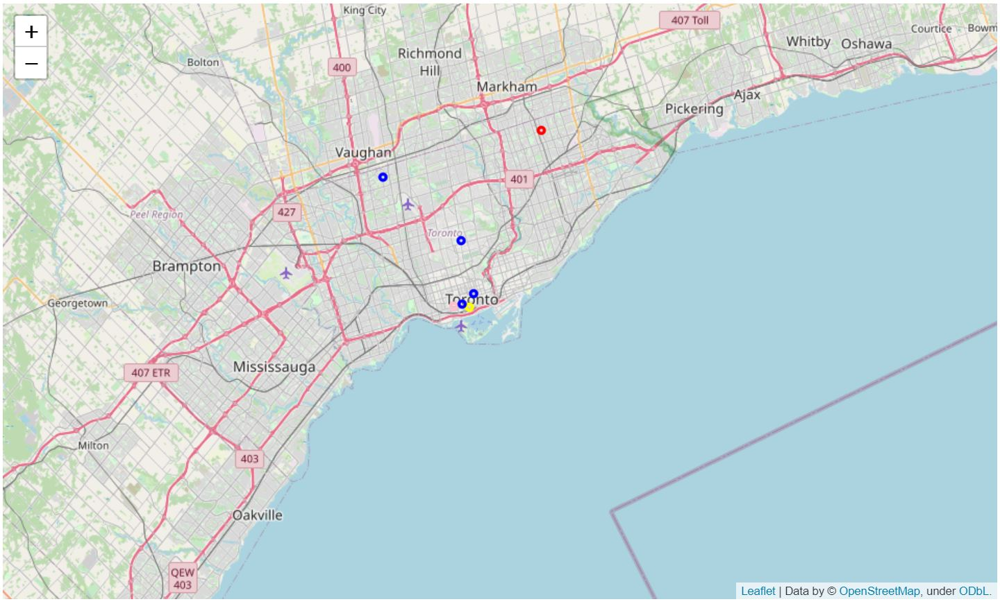

In [1]:
from IPython.display import Image
Image("C:/Users/beuzitlouis/Documents/DTU/Cours/Second semester/Advanced Business Analytics/Final project/Yelp/Toronto/MapToronto1.JPG")

The file Business_Metropolis can be downloaded by running the notebook: DescripitveAnalysis Yelp Dataset inside: https://github.com/hecmesge/ABA2020

In [49]:
Business=pd.read_excel('Business-Metropolis.xlsx')

On this file, we will consider all of the restaurants near Toronto.

In [50]:
Business.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
0,10913 Bailey Rd,"{'BusinessAcceptsCreditCards': 'True', 'BikePa...",f9NumwFMBDn751xgFiRbNA,"Active Life, Gun/Rifle Ranges, Guns & Ammo, Sh...",Cornelius,"{'Monday': '10:0-18:0', 'Tuesday': '11:0-20:0'...",1,35.462724,-80.852612,The Range At Lake Norman,28031,36,3.5,NC,Charlotte,31.479344
1,21206 Catawba Ave,"{'BusinessParking': ""{'garage': False, 'street...",90oH6tilpqsCkz7Dhcxejw,"Massage Therapy, Health & Medical, Beauty & Sp...",Cornelius,"{'Monday': '0:0-0:0', 'Tuesday': '9:0-19:0', '...",1,35.482426,-80.862377,Massage In Davidson,28031,16,5.0,NC,Charlotte,31.479344
2,20124 W Catawba,"{'RestaurantsGoodForGroups': 'False', 'Restaur...",MyiqKhZd8N08q9qilxRcPQ,"Food, Bakeries, Restaurants, Pizza",Cornelius,NaN,0,35.482247,-80.880667,Our Daily Bread,28031,5,4.0,NC,Charlotte,31.479344
3,NaN,NaN,1KgIKyWcd0ex5pJkoDxRgg,"Contractors, Home Services",Cornelius,NaN,1,35.472468,-80.887586,CJG Construction,28031,3,3.5,NC,Charlotte,31.479344
4,19706 One Norman Blvd,"{'BusinessAcceptsCreditCards': 'True', 'Restau...",4U2JtoWJbhC-NAltPLdtEA,"Used, Vintage & Consignment, Shopping, Fashion...",Cornelius,NaN,0,35.480612,-80.881848,The Salvation Army,28031,6,4.0,NC,Charlotte,31.479344


In [51]:
Business=Business[Business['categories'].notnull()==True]
restaurants=Business[Business['categories'].str.contains('Restaurants')]

In [52]:
restaurants.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
2,20124 W Catawba,"{'RestaurantsGoodForGroups': 'False', 'Restaur...",MyiqKhZd8N08q9qilxRcPQ,"Food, Bakeries, Restaurants, Pizza",Cornelius,NaN,0,35.482247,-80.880667,Our Daily Bread,28031,5,4.0,NC,Charlotte,31.479344
8,18059-8 W Catawba Ave,"{'BusinessAcceptsCreditCards': 'True', 'Restau...",2E57EmAD7qdfS1NL8_EfMQ,"Restaurants, Italian, Pizza",Cornelius,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,35.459641,-80.888911,Buscemis Pizza,28031,4,4.0,NC,Charlotte,31.479344
9,8321 Magnolia Estates Dr,"{'RestaurantsAttire': ""'casual'"", 'GoodForKids...",vyexrAQSWvV_DyEBWrIBCg,"Restaurants, Bars, Burgers, Nightlife, America...",Cornelius,"{'Monday': '11:0-2:0', 'Tuesday': '11:0-2:0', ...",1,35.474824,-80.889144,Al's Bar & Grille,28031,37,3.5,NC,Charlotte,31.479344
10,18665 Harborside Dr,"{'RestaurantsTakeOut': 'True', 'NoiseLevel': ""...",XxX2LZ2o9p9Wlq7noOcfNg,"Diners, Restaurants, Seafood, American (New), ...",Cornelius,"{'Monday': '11:30-22:0', 'Tuesday': '11:30-22:...",1,35.464403,-80.893408,Port City Club,28031,269,3.5,NC,Charlotte,31.479344
15,19901 S Main St,"{'Alcohol': ""u'none'"", 'BikeParking': 'False',...",hf9j-PbDf_ixA43xSH8y8g,"American (Traditional), Restaurants",Cornelius,"{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",0,35.480218,-80.857844,From Scratch By Chef Gigi,28031,21,4.0,NC,Charlotte,31.479344


In [53]:
restaurants=restaurants[restaurants['metropolis']=='Toronto']

In [54]:
print(len(restaurants))

16227


Let's say not more than 20 kilometers to Toronto

In [55]:
restaurants_Toronto=restaurants[restaurants['distance metropolis']<=20].reset_index(drop = True)

In [56]:
print(len(restaurants_Toronto))

11067


In [57]:
long=restaurants_Toronto['longitude']
lat=restaurants_Toronto['latitude']

We plot all of these restaurants:

In [58]:
# Toronto location
lat_T = 43.651070
lon_T = -79.347015

map_T = folium.Map([lat_T, lon_T], zoom_start=10)


for i in range(len(long)):
    # Circle marker
    folium.CircleMarker([lat[i],long[i]], radius=1, color='black').add_to(map_T)

for i in range(len(TaiTaiBox_lat)):
    # Circle marker
    folium.CircleMarker([TaiTaiBox_lat[i], TaiTaiBox_long[i]], radius=3, color='red').add_to(map_T)
    
    
    
for i in range(len(Sammy_lat)):
    # Circle marker
    folium.CircleMarker([Sammy_lat[i], Sammy_long[i]], radius=3, color='yellow').add_to(map_T)
    
for i in range(len(Come_lat)):
    # Circle marker
    folium.CircleMarker([Come_lat[i], Come_long[i]], radius=3, color='pink').add_to(map_T)
    
for i in range(len(BanhMiBoys_lat)):
    # Circle marker
    folium.CircleMarker([BanhMiBoys_lat[i], BanhMiBoys_long[i]], radius=3, color='blue').add_to(map_T)
    
map_T

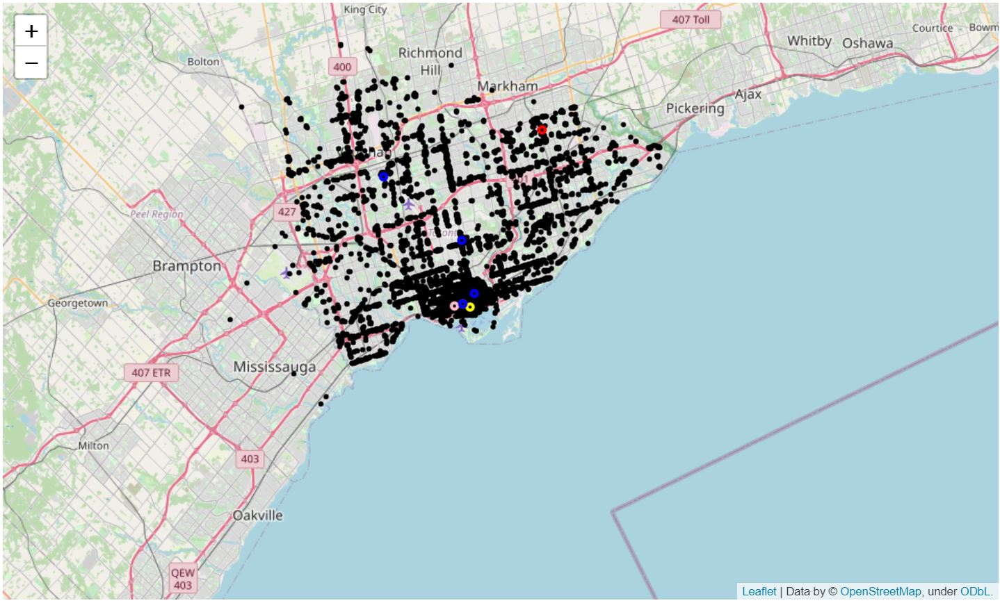

In [2]:
Image("C:/Users/beuzitlouis/Documents/DTU/Cours/Second semester/Advanced Business Analytics/Final project/Yelp/Toronto/MapToronto2.JPG")

In this map, there is Banh Mi Boys's restaurants (in blue), the main competitors of Banh Mi Boys (pink, yellow and red) and the restaurants in the city of Toronto (in Black). These restaurants correspond to the demand in the area (principle of equilibrium) 

In [59]:
from sklearn.cluster import KMeans

In [60]:
points=[]

for i in range(len(long)):
    point=[]
    point.append(long[i])
    point.append(lat[i])
    
    points.append(point)
    


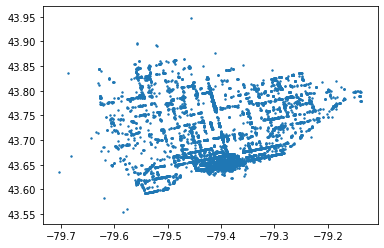

In [61]:
plt.scatter(long,lat, s=2)

We have the four restaurants of Banh Mi Boys and four main competitors, if we were to open a fifth restaurant for Banh Mi Boys, that is to say a ninth restaurant among all of the restaurants we have chosen, were would we put this new restaurant ?

Let's do a clustering on all of the restaurants in Toronto, indeed, we consider that the restaurants are here because there is a demand, so the more there are restaurants in an area, the more customers there are.

Finally, the idea is to analyze where Banh Mi Boys could install a new restaurant in order to win market shares where his competitors aren't already present.

In [62]:
km=KMeans(9)
km.fit(points)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=9, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

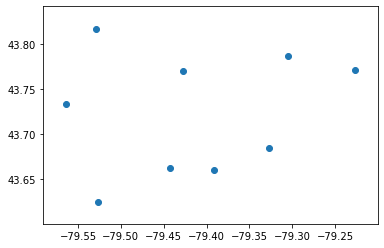

In [63]:
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:,1]);
    

In [64]:
len(km.cluster_centers_)

9

In [65]:
# Toronto location
lat_T = 43.651070
lon_T = -79.347015

map_T = folium.Map([lat_T, lon_T], zoom_start=10)


for i in range(len(long)):
    # Circle marker
    folium.CircleMarker([lat[i],long[i]], radius=1, color='black').add_to(map_T)
    
for i in range(len(TaiTaiBox_lat)):
    # Circle marker
    folium.CircleMarker([TaiTaiBox_lat[i], TaiTaiBox_long[i]], radius=3, color='red').add_to(map_T)
    
    
    
for i in range(len(Sammy_lat)):
    # Circle marker
    folium.CircleMarker([Sammy_lat[i], Sammy_long[i]], radius=3, color='yellow').add_to(map_T)
    
for i in range(len(Come_lat)):
    # Circle marker
    folium.CircleMarker([Come_lat[i], Come_long[i]], radius=3, color='pink').add_to(map_T)
    
for i in range(len(BanhMiBoys_lat)):
    # Circle marker
    folium.CircleMarker([BanhMiBoys_lat[i], BanhMiBoys_long[i]], radius=3, color='blue').add_to(map_T)
    
for i in range(len(km.cluster_centers_)): 
    folium.CircleMarker([km.cluster_centers_[i,1], km.cluster_centers_[i,0]], radius=3, color='cyan').add_to(map_T)
    
    
map_T

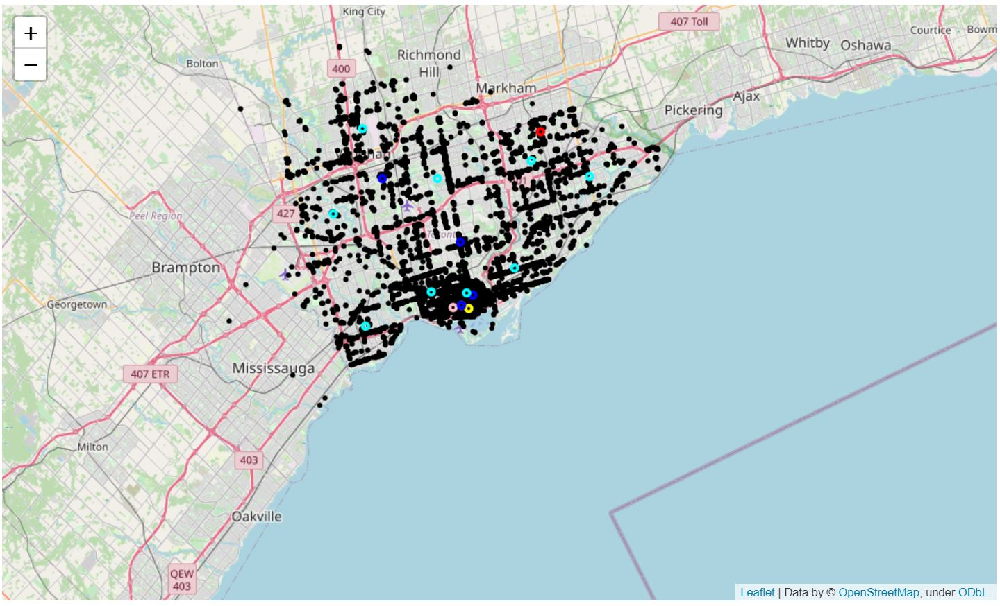

In [3]:
Image("C:/Users/beuzitlouis/Documents/DTU/Cours/Second semester/Advanced Business Analytics/Final project/Yelp/Toronto/MapToronto3.JPG")

In this map, there is Banh Mi Boys's restaurants (in blue), the main competitors of Banh Mi Boys (pink, yellow and red), the restaurants in the city of Toronto (in Black) and the clusters of demands for restaurants (in cyan).

all in all, Banh Mi Boys could take the opportunity to open a new restaurant on the east of Toronto or on the west where neither Banh mi Boys nor his competitors are present.

For example if Banh Mi Boys wanted to improve his delivery system, to expand his area of influence in these two areas mentionned above.